<center>
<b><H1>TÉCNICAS DE INTELIGENCIA ARTIFICIAL</H1></b><br><br>
<H2><b>Taller de filtros</H2></b><br>
<H3><b>Docente:</b><br>
Daniel Vargas Medina<br> <br><br>
 <b>Presentan:</b><br>
Brian Camilo Saiz Cavanzo<br>
Camilo Esteban Zambrano Pereira <br><br>
<b>Fecha:</b><br>
25 de marzo de 2022<br><br>
</H3></center>

In [1]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from IPython.display import HTML

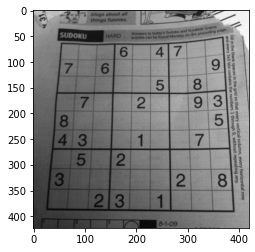

In [46]:
img = cv2.imread("fig/hsLhe.jpg", 0)
plt.imshow(img, cmap="gray")

In [3]:
def prewitt(img):
    directions = [np.array([[-1, -1, -1], [1, -2, 1], [1, 1, 1]]),
    np.array([[1, 1, 1], [1, -2, 1], [-1, -1, -1]]),
    np.array([[1, 1, -1], [1, -2, -1], [1, 1, -1]]),
    np.array([[-1, 1, 1], [-1, -2, 1], [-1, 1, 1]]),
    np.array([[1, 1, 1], [-1, -2, 1], [-1, -1, 1]]),
    np.array([[-1, -1, 1], [-1, -2, 1], [1, 1, 1]]),
    np.array([[1, 1, 1], [1, -2, -1], [1, -1, -1]]),
    np.array([[1, -1, -1], [1, -2, -1], [1, 1, 1]])]
    
    images = [cv2.filter2D(img, -1, direction) for direction in directions]
    figura = plt.figure()
   
    shape = img.shape
    new_img = np.zeros((shape))
    for imagen in images:
        new_img = new_img + imagen
    new_img = cv2.normalize(new_img/8,  new_img, 0, 255, cv2.NORM_MINMAX)

    return new_img, images
    

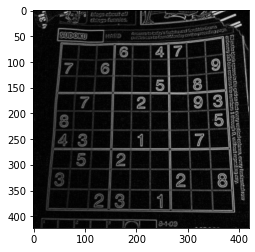

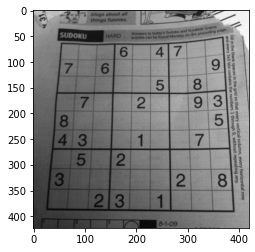

In [4]:
prewitt_img, directions = prewitt(img)
plt.imshow(prewitt_img, cmap="gray")
plt.figure()
plt.imshow(img, cmap="gray")

# **Conclusiones del Prewitt**
Teniendo en cuenta que el filtro Prewitt es la suma de ocho imágenes a las que se les aplica un filtro diferente a cada una, se puede observar desde como se configuran las matrices que actúan en cada pixel como en los mismos resultados obtenidos después de implementar cada filtro en la imagen principal,   que cada uno de estos busca aumentar el efecto que produce la incidencia de la luz, es decir que cada uno de estos busca acentuar los efectos que tiene la luz sobre la imagen dependiendo de la orientación del filtro.
Estos efectos se pueden apreciar mejor en la pareja de filtros norte y sur y la pareja este y oeste, donde en la primera busca resaltar las líneas horizontales tanto superiores como inferiores mientras que la segunda pareja tiene el mismo efecto en las líneas verticales.

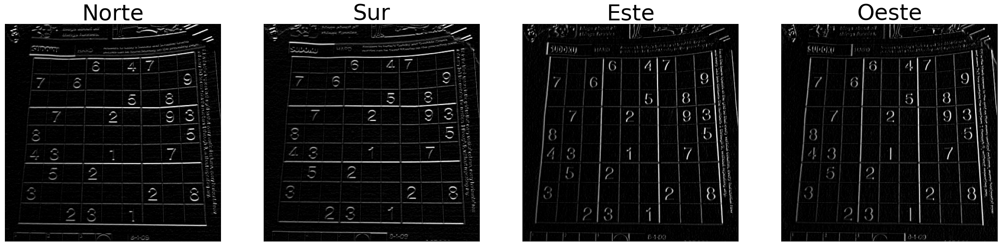

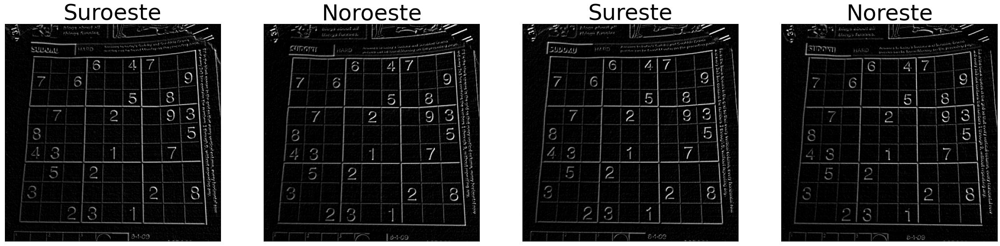

In [5]:
directions_names=["Norte","Sur","Este","Oeste","Suroeste","Noroeste","Sureste","Noreste"]
figura = plt.figure()
plt.title('Figura 1. Filtro Prewitt desagregado por orientación.', fontsize=16)
for i, imgf in enumerate(directions):
  plt.figure(int(i/4)+1).set_size_inches(40, 50) #, plt.suptitle('Figura 1. Filtro Prewitt desagregado por orientación.', fontsize=16)
  plt.subplot(int(i/4)+1,4, i+1 if i/4 < 1 else i-3 ),plt.imshow(directions[i],cmap = 'gray')
  plt.title(directions_names[i],fontsize=50), plt.xticks([]), plt.yticks([]) 

Una analogía al efecto que produce el filtro de Prewitt es el que se logra manejando la iluminación en una fotografía, como se puede observar en el siguiente vídeo pues cuando la fuente proviene de la parte superior o inferior  los aspectos que destacan son los que se encuentran más perpendicular a la dirección de la fuente de luz es decir los rasgos horizontales mientras que cuando la fuente proviene de los laterales los elementos que se encuentran más perpendiculares son los que están orientados verticalmente.Finalmente al sumar el resultado de la aplicación de los diferentes filtros que componen al filtro Prewitt es marcar los bordes diferentes bordes gracias al efecto de realce que tiene cada filtro y su dirección de intensificación.

In [6]:
HTML('<iframe src="https://player.vimeo.com/video/63602119?h=d6bdf94065" width="700" height="394" frameborder="0" webkitallowfullscreen mozallowfullscreen allowfullscreen></iframe><p><a href="https://vimeo.com/26763844">BAXTER DURY - CLAIRE (Dir Cut)</a> from <a href="https://vimeo.com/dannysangra">Danny Sangra</a> on <a href="https://vimeo.com">Vimeo</a>.</p>')

# Redimensionamiento 

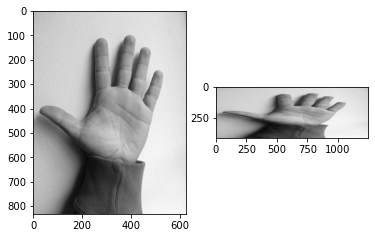

In [40]:
soleado = cv2.imread("fig/soleado.jpg",0)
height, width = soleado.shape[:2]
soleado_escalado = cv2.resize(soleado, (0, 0), fx=2, fy=0.5, interpolation = cv2.INTER_CUBIC)
fig, ax = plt.subplots(1, 2)
ax[0].imshow(soleado, cmap="gray")
ax[1].imshow(soleado_escalado, cmap="gray")

# Umbralización

In [41]:
def umbralizacion(img, umbral):
    methods = [cv2.THRESH_BINARY, 
                 cv2.THRESH_BINARY_INV, 
                 cv2.THRESH_TRUNC, 
                 cv2.THRESH_TOZERO, 
                 cv2.THRESH_TOZERO_INV,
                 cv2.THRESH_MASK,
                 cv2.THRESH_OTSU,
                 cv2.THRESH_TRIANGLE]
    images = [cv2.threshold(img, umbral, 255, method)[1] for method in methods]
    return images

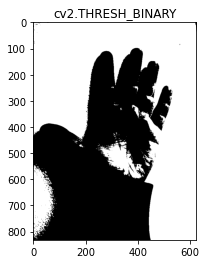

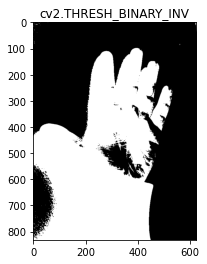

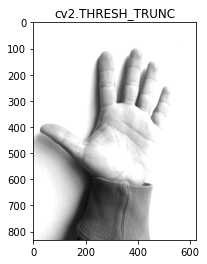

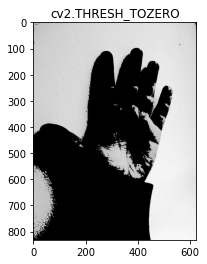

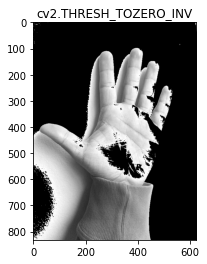

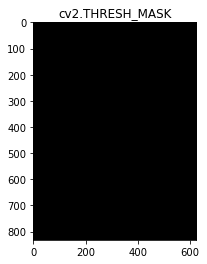

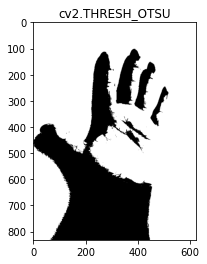

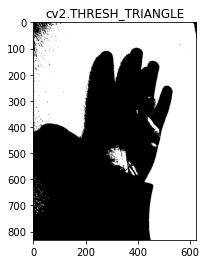

In [42]:
umbralizated_images = umbralizacion(soleado, 170)
methods = ["cv2.THRESH_BINARY", 
        "cv2.THRESH_BINARY_INV", 
        "cv2.THRESH_TRUNC", 
        "cv2.THRESH_TOZERO", 
        "cv2.THRESH_TOZERO_INV",
        "cv2.THRESH_MASK",
        "cv2.THRESH_OTSU",
        "cv2.THRESH_TRIANGLE"]
for i in range(len(umbralizated_images)):
    plt.figure()
    plt.imshow(umbralizated_images[i], cmap="gray")
    plt.title(methods[i])
    

La umbralización se puede utilizar para aclarar la imagen y/o reducir sombras. Se puede observar que en este caso, la umbralización ideal es la truncada, la cual elimina de buena manera las sombras de la imagen. Sin embargo, esto va a depender de la aplicación.

# Umbral adaptativo

In [43]:
def umbral_adaptativo(img, umbral):
    methods = [cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.ADAPTIVE_THRESH_MEAN_C]
    images = [cv2.adaptiveThreshold(img, umbral, method, cv2.THRESH_BINARY, 199, 5) for method in methods]
    return images

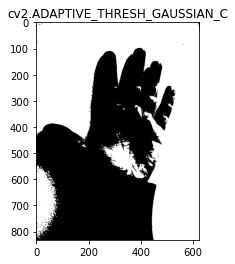

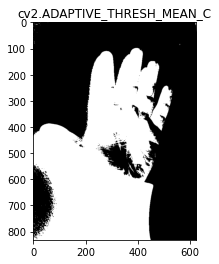

In [45]:
adaptative_umbralized_images = umbral_adaptativo(img, 180)
methods = ["cv2.ADAPTIVE_THRESH_GAUSSIAN_C",
        "cv2.ADAPTIVE_THRESH_MEAN_C"]
for i in range(len(adaptative_umbralized_images)):
    plt.figure()
    plt.imshow(umbralizated_images[i], cmap="gray")
    plt.title(methods[i])

# Filtros lineale

In [12]:
def filtro_lineal(img, kernel = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])):
    return cv2.filter2D(img, -1, kernel)

Text(0.5, 1.0, 'Imagen con filtro lineal')

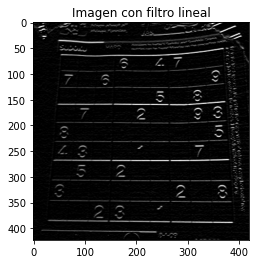

In [13]:
img_filtrado = filtro_lineal(img)
plt.imshow(img_filtrado, cmap = "gray")
plt.title("Imagen con filtro lineal")

Con los filtros, dependiendo del kernel, se puede obtener un realce de bordes, en este caso, el kernel resalta los bordes horizontales.

# Filtros de suavizado

In [23]:
def suavizado(img, kernel_size=3, d=15, blur=80):
    images = [cv2.blur(img, (kernel_size, kernel_size)),
             cv2.medianBlur(img, kernel_size),
             cv2.GaussianBlur(img, (kernel_size, kernel_size), 0),
             cv2.bilateralFilter(img, d, blur, blur)]
    return images

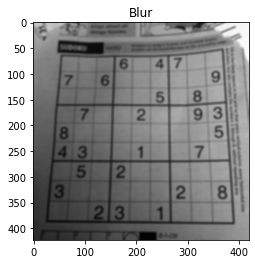

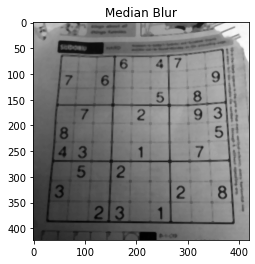

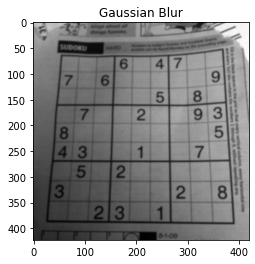

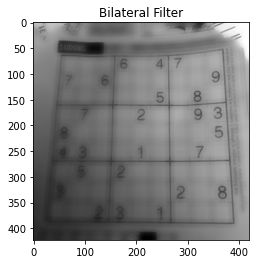

<Figure size 432x288 with 0 Axes>

In [48]:
imagenes_suavizadas = suavizado(img, 5, 20, 60)
methods = ["Blur", "Median Blur", "Gaussian Blur", "Bilateral Filter"]
for i in range(len(imagenes_suavizadas)):
    plt.imshow(imagenes_suavizadas[i], cmap="gray")
    plt.title(methods[i])
    plt.figure()

De estos filtros se observa que el median blur realza las itersecciones entre lineas, puede ser util para detección de esquinas. En este caso, el blur y el gaussian blur presentan resultados similares, mientras que el bilateral filter difumina la imagen pero se observa que algunos números siguen siendo bastante legibles a pesar de la transformación.

# Filtros de realce de contorno

In [28]:
images_t1 = [cv2.imread('fig/interior.jpg', 0),
             cv2.imread('fig/soleado.jpg', 0),
             cv2.imread('fig/sombra.jpg', 0)]
imgs_f_names = ['Original','Laplaciano','Canny','Sobel-X','Sobel-Y']
imgs_t_names = ['Interior','Soleado','Sombra']

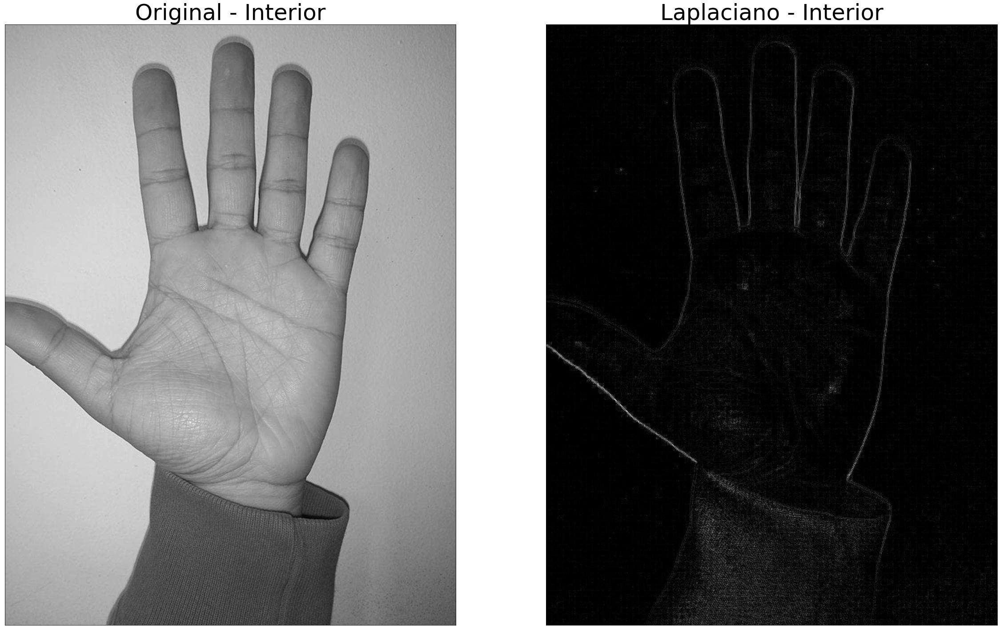

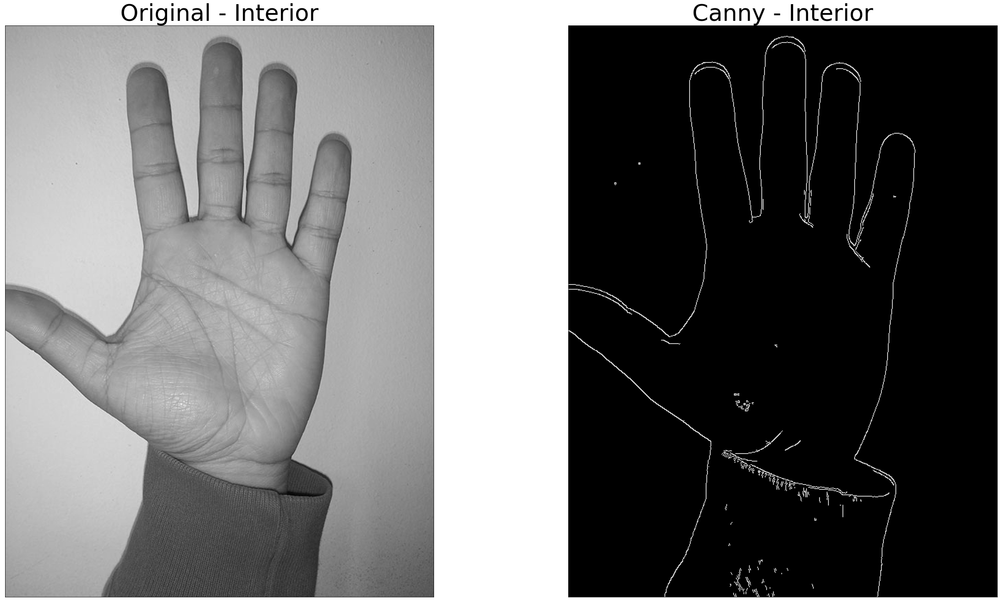

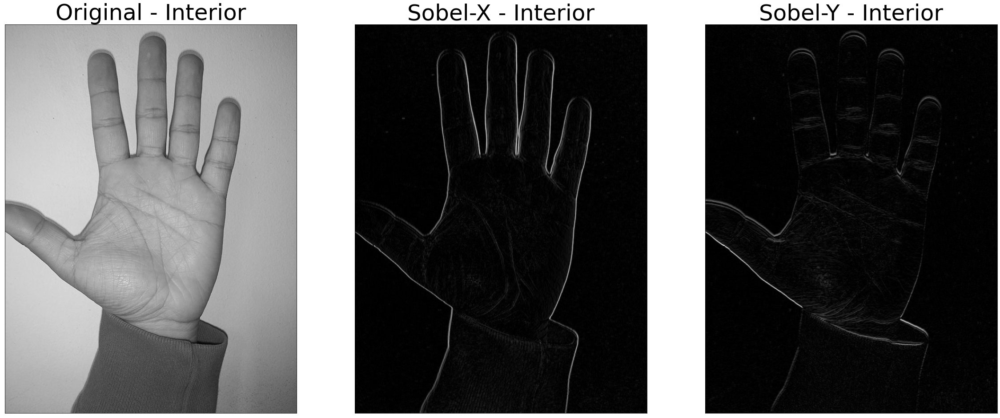

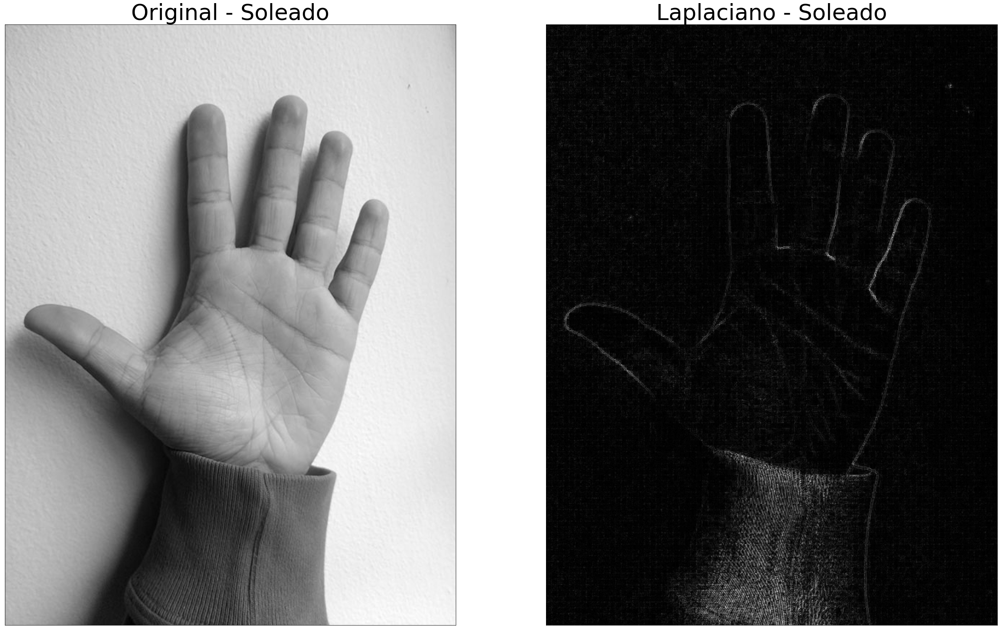

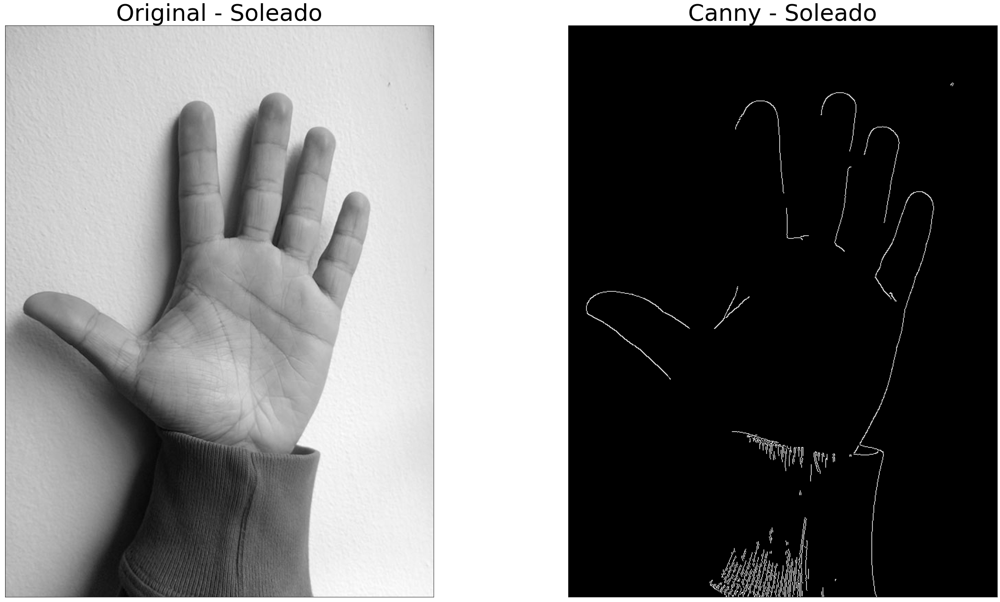

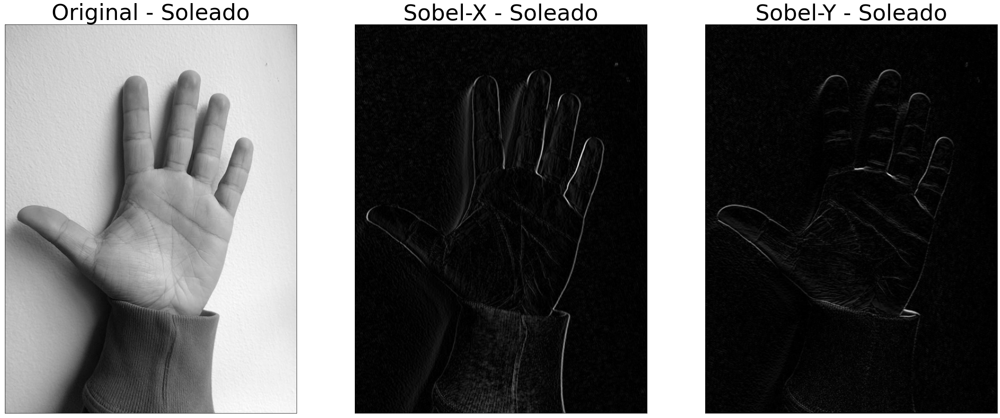

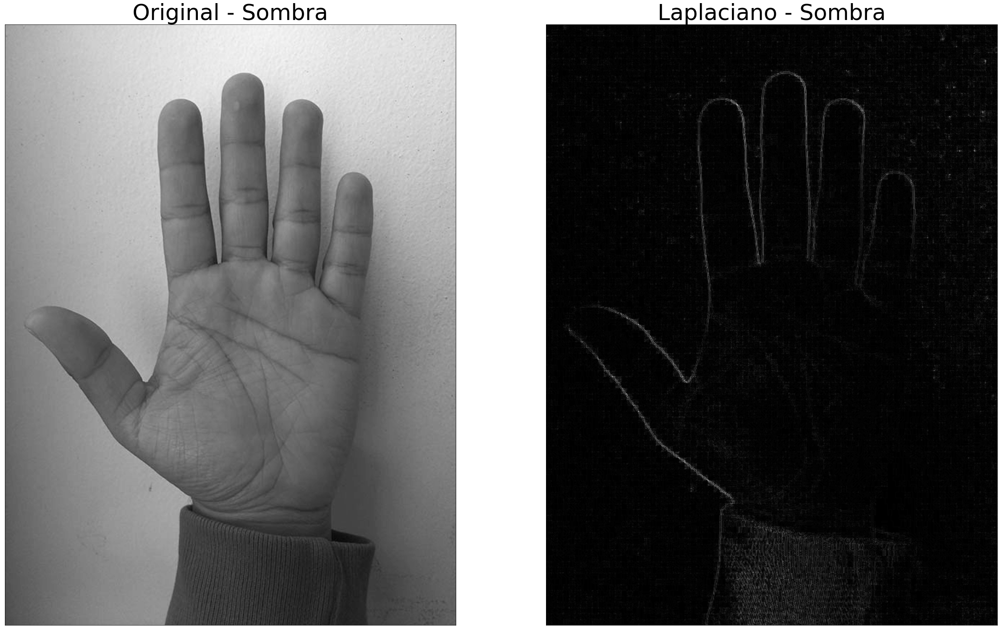

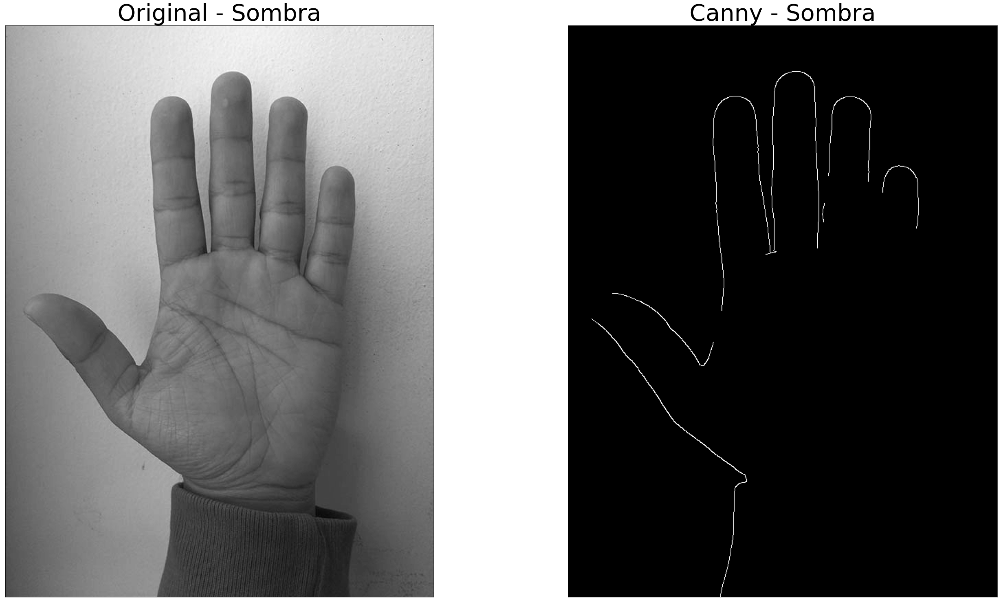

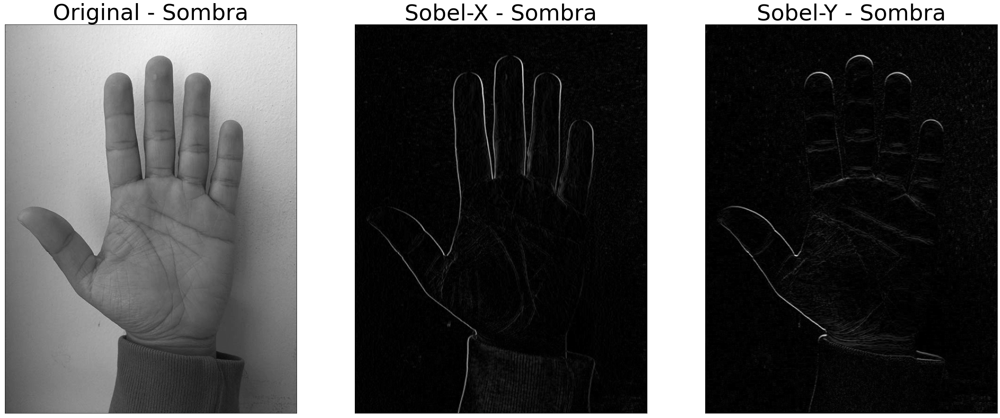

In [30]:
for i, imgs_T1 in enumerate(images_t1):
    imgs_F = [ imgs_T1,
                abs(cv2.Laplacian(imgs_T1,cv2.CV_64F)),
                cv2.Canny(imgs_T1,100,200),
                abs(cv2.Sobel(imgs_T1,cv2.CV_64F,1,0,ksize=5)), 
                abs(cv2.Sobel(imgs_T1,cv2.CV_64F,0,1,ksize=5))]  
    for j in range (1, 3):
        plt.figure(i).set_size_inches(40, 50)
        plt.subplot(j,2, 1),plt.imshow(imgs_F[0],cmap = 'gray')
        plt.title(imgs_f_names[0] + ' - '+ imgs_t_names [i],fontsize=50), plt.xticks([]), plt.yticks([]) 
        plt.subplot(j,2, 2),plt.imshow(imgs_F[j],cmap = 'gray')
        plt.title(imgs_f_names[j]+ ' - '+ imgs_t_names [i],fontsize=50), plt.xticks([]), plt.yticks([])
        plt.show()
    plt.figure(i).set_size_inches(40, 50)
    plt.subplot(1,3, 1),plt.imshow(imgs_F[0],cmap = 'gray')
    plt.title(imgs_f_names[0]+ ' - '+ imgs_t_names [i],fontsize=50), plt.xticks([]), plt.yticks([]) 
    plt.subplot(1,3, 2),plt.imshow(imgs_F[3],cmap = 'gray')
    plt.title(imgs_f_names[3]+ ' - ' +imgs_t_names [i],fontsize=50), plt.xticks([]), plt.yticks([])
    plt.subplot(1,3, 3),plt.imshow(imgs_F[4],cmap = 'gray')
    plt.title(imgs_f_names[3]+ ' - '+ imgs_t_names [i],fontsize=50), plt.xticks([]), plt.yticks([])
    plt.title(imgs_f_names[4]+' - '+ imgs_t_names [i],fontsize=50), plt.xticks([]), plt.yticks([])
    plt.show()



Del ejercicio anterior se puede confirmar que los filtros Laplaciano, Sobel, Canny tienen como principal función realzar el contorno de las imágenes, a tal punto que el resultado de aplicar estos filtros en su mayoría gire en torno a la información relacionada con el contorno. Teniendo en cuenta lo anteriormente dicho y las aplicaciones en las que se pueden hacer uso este tipo de filtros, se puede establecer que:
-El filtro laplaciano es el que mayor ruido aporta a las imágenes procesadas seguido por el Sobel y el Canny, siendo este último  el que mejor extrae información de los contornos marcados.
-Ya que el filtro Sobel posee dos componentes que proporcionan información de dos orientaciones principales (horizontal y vertical) hace que sus resultados sean robustos al hacer provecho de la información que brinda cada componente. Ahora bien, en presencia de una fuente de luz intensa produce que aumente la presencia de ruido en el resultado final.
-Si bien el filtro Canny se caracteriza por extraer la información necesaria y pertinente relacionada al contorno para hacer el mejor provecho de este, se requieren condiciones particulares de luz en las imágenes a procesar, particularmente de la orientación de la fuente de luz pues se observa que la presencia de sombras hace que decaiga la eficiencia del filtro.